# CW2 - Coding Part 2 (30 points)
# Variational Autoencoders
Build a Convolutional Variational AutoEncoder and achieve best possible reconstruction and latent space disentanglement. Then answer the questions.

In [1]:
import os
import numpy as np
import torch
import torch.nn as nn
from torchvision import datasets, transforms
from torchvision.transforms import ToTensor
from torchvision.utils import make_grid
from torchsummary import summary

import matplotlib.pyplot as plt
import pandas as pd
import altair as alt

/Users/user/anaconda3/lib/python3.11/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: 'dlopen(/Users/user/anaconda3/lib/python3.11/site-packages/torchvision/image.so, 0x0006): Symbol not found: __ZN3c106detail19maybe_wrap_dim_slowIxEET_S2_S2_b
  Referenced from: <E03EDA44-89AE-3115-9796-62BA9E0E2EDE> /Users/user/anaconda3/lib/python3.11/site-packages/torchvision/image.so
  Expected in:     <F2FE5CF8-5B5B-3FAD-ADF8-C77D90F49FC9> /Users/user/anaconda3/lib/python3.11/site-packages/torch/lib/libc10.dylib'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(


In [2]:
# Use GPU if available
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device")

Using cpu device


In [3]:
def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

In [4]:
# Load the data

#######################################################################
#                       ** START OF YOUR CODE **
#######################################################################

#                 ** MODIFY CODE HERE IF NECESSARY **

batch_size = 100

data_transforms = transforms.Compose(
    [
        transforms.ToTensor(),
    ]
)

def denormalize(x):
    return x

#######################################################################
#                       ** END OF YOUR CODE **
#######################################################################

training_data = datasets.MNIST(
    root="data",
    train=True,
    download=True,
    transform=data_transforms,
)

train_dataloader = torch.utils.data.DataLoader(
    training_data,
    batch_size=batch_size,
    shuffle=True,
)

# Download test data
test_data = datasets.MNIST(
    root="data",
    train=False,
    download=True,
    transform=data_transforms,
)

test_dataloader = torch.utils.data.DataLoader(
    test_data,
    batch_size=batch_size,
)

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting data/MNIST/raw/train-images-idx3-ubyte.gz to data/MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting data/MNIST/raw/train-labels-idx1-ubyte.gz to data/MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting data/MNIST/raw/t10k-images-idx3-ubyte.gz to data/MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting data/MNIST/raw/t10k-labels-idx1-ubyte.gz to data/MNIST/raw



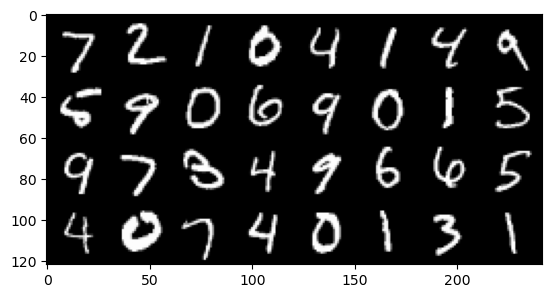

In [5]:
sample_inputs, _ = next(iter(test_dataloader))
fixed_input = sample_inputs[0:32, :, :, :]
# visualize the original images of the last batch of the test set
img = make_grid(denormalize(fixed_input), nrow=8, padding=2, normalize=False,
                scale_each=False, pad_value=0)
plt.figure()
show(img)

# Variational Auto Encoders (VAEs)

<figure>
  <img src="https://blog.bayeslabs.co/assets/img/vae-gaussian.png" style="width:60%">
  <figcaption>
    Fig.1 - VAE Diagram (with a Guassian prior), taken from <a href="https://blog.bayeslabs.co/2019/06/04/All-you-need-to-know-about-Vae.html">2</a>.
  </figcaption>
</figure>

## Build a convolutional VAE (5 points)

The only requirement is that it contains convolutions both in the encoder and decoder. You can still use some linear layers if needed.

In [350]:
# Convolutional VAE implementation here
class VAE(nn.Module):
    def __init__(self, latent_dim):
        super(VAE, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        self.latent_dim = latent_dim

        # Encoder layers: 
        # First - 2 convolutional relu average pool layers
        self.enc_conv_relu_pool_stack = nn.Sequential(
            # layer 1
            nn.Conv2d(in_channels=1, out_channels=16, kernel_size=4, stride=1),
            nn.ReLU(),
            nn.AvgPool2d(2),
            
            # layer 2
            nn.Conv2d(in_channels=16, out_channels=32, kernel_size=4, stride=1),
            nn.ReLU(),
            )
        
        # Second - MLP head with 2 fully connected layers, and Relu activation function
        self.encoder_linear_1 = nn.Linear(32 * 9 * 9, 128)
        self.relu = nn.ReLU()
        self.encoder_linear_2_mean = nn.Linear(128, self.latent_dim)
        self.encoder_linear_2_std = nn.Linear(128, self.latent_dim)


        # Decoder layers:
        # First 2 fully connected layers (will be used with reluc activation function)
        self.decoder_linear_1 = nn.Linear(self.latent_dim, 128)
        self.decoder_linear_2 = nn.Linear(128, 16 * 10 * 10)

        # Second - 2 resize and convolutional layers.
        self.decoder_resize_conv_stack = nn.Sequential(
            # Layer 1
            transforms.Resize((18, 18), interpolation=transforms.InterpolationMode.NEAREST),
            nn.Conv2d(16, 32, 4, 1, 1),
            nn.ReLU(),

            # Layer 2
            transforms.Resize((28, 28), interpolation=transforms.InterpolationMode.NEAREST),
            nn.Conv2d(32, 1, 3, 1, 1),
            # Lastly, sigmoid activation for output between 0 and 1
            nn.Sigmoid(),
        )

        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################

    def encode(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        # First - convolutional layers to extract features from images
        x = self.enc_conv_relu_pool_stack(x)

        # reshape to prepare for mlp head
        x = x.view(x.size(0), -1)

        # mlp head of 2 fully connected layers and relu activation funciton
        x = self.relu(self.encoder_linear_1(x))
        mean = self.encoder_linear_2_mean(x)
        
        # Encoded as the log of the variance as suggested in class
        logvar = self.encoder_linear_2_std(x)

        return mean, logvar

        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################

    def reparametrize(self, mean, logvar):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################

        # calculate std (root quare of variance) based on log of the variance
        std = torch.exp(0.5*logvar)

        # The prior is assumed to be distributed like a Normal Gaussian
        epsilon = torch.randn(std.size()).to(device)
        return mean + std*epsilon

        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################

    def decode(self, z):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################

        # First two fully connected layers with relu activation to increase the dimention of the latent vector
        out = self.relu(self.decoder_linear_1(z))
        out = self.relu(self.decoder_linear_2(out))

        # Reshape to 16 channels of 10*10 images, to prepare for convolution and resize layers
        out = out.view(out.size(0), 16, 10, 10)
        
        # Convolution and resize layers to increase resolution and reduce to 1 channel
        out = self.decoder_resize_conv_stack(out)

        return out

        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################

    def forward(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################

        mean, logvar = self.encode(x)

        # Use reparametirization trick before reconstruction to allow backward proporation in training process
        z = self.reparametrize(mean, logvar)

        # Return latent mean and logvar as well as the reconstructed image
        return mean, logvar, self.decode(z)

        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################


#######################################################################
#                       ** START OF YOUR CODE **
#######################################################################

latent_dim = 28

#######################################################################
#                       ** END OF YOUR CODE **
#######################################################################

temp_model = VAE(latent_dim).to(device)
summary(temp_model, (1, 28, 28))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 16, 25, 25]             272
              ReLU-2           [-1, 16, 25, 25]               0
         AvgPool2d-3           [-1, 16, 12, 12]               0
            Conv2d-4             [-1, 32, 9, 9]           8,224
              ReLU-5             [-1, 32, 9, 9]               0
            Linear-6                  [-1, 128]         331,904
              ReLU-7                  [-1, 128]               0
            Linear-8                   [-1, 28]           3,612
            Linear-9                   [-1, 28]           3,612
           Linear-10                  [-1, 128]           3,712
             ReLU-11                  [-1, 128]               0
           Linear-12                 [-1, 1600]         206,400
             ReLU-13                 [-1, 1600]               0
           Resize-14           [-1, 16,

Briefly Explain your architectural choices

<font color='red'>***YOUR ANSWER***</font>

The main choice to explain is the one I did for the decoder: Instead of using deconvolution layers (transposed convolution) to increase the resolution of the image, I chose to use upsampling with nearest-neighbor interpulation. This is in order to avoid the "checkboard artifact" phenomena, created by overlap in deconvolution, as detailed in [this paper](https://distill.pub/2016/deconv-checkerboard/)

Other than that, I chose to use two convolutional layers with relu activation function for the encoder, including 32 channels to allow the model learn and encode the different pattenrs that creates the different digits. I added an MLP head of 2 layers to the model to further decrease the dimention of the information into the latent random variable.

For the decoder, I started with an MLP of 2 layers with relu activation function in order to first increase the dimention of the latent vector into a dimention that could be reshaped into an image with a few channels. Then, I used layers of upsampling and regular convolution as detailed above.

In addition, I used sigmoid activation function on the last layer of the decoder, to ensure that the output will be between 0 and 1, similarly to the input domain. This will be useful for the selection of loss function, as detailed in next question.

## Defining a Loss (6 points)

The Beta VAE loss, with encoder $q$ and decoder $p$:
$$ L=\mathbb{E}_{q_\phi(z \mid X)}[\log p_\theta(X \mid z)]-\beta D_{K L}[q_\phi(z \mid X) \| p_\theta(z)]$$

The loss you implement depends on your choice of latent prior and model outputs.

There exist different solutions that are equally correct. Depending on your assumptions you might want to do a data preprocessing step.



max_val is: 1.0
min val is: 0.0
mean is: 0.11988329887390137
std is: 0.2958832383155823


(array([64814.,   431.,   474.,   311.,   339.,   267.,   304.,   268.,
          253.,   232.,   286.,   172.,   268.,   259.,   225.,   321.,
          246.,   246.,   257.,   238.,   258.,   256.,   274.,   272.,
          314.,   288.,   369.,   410.,   465.,  5283.]),
 array([0.        , 0.03333334, 0.06666667, 0.1       , 0.13333334,
        0.16666667, 0.2       , 0.23333333, 0.26666668, 0.30000001,
        0.33333334, 0.36666667, 0.40000001, 0.43333334, 0.46666667,
        0.5       , 0.53333336, 0.56666666, 0.60000002, 0.63333333,
        0.66666669, 0.69999999, 0.73333335, 0.76666665, 0.80000001,
        0.83333331, 0.86666667, 0.89999998, 0.93333334, 0.96666664,
        1.        ]),
 <BarContainer object of 30 artists>)

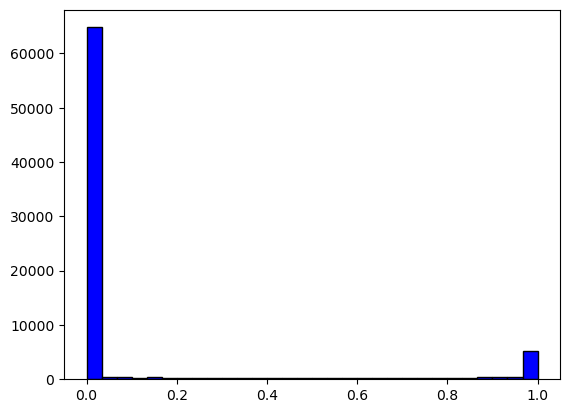

In [224]:
# Data exploration for deciding on loss function - 
# Firstly, check the values of the pixels to understand the nature of the data. 
# If the values are between 0 and 1, it might be worth to use the cross entropy error.
sample_input, _ = next(iter(test_dataloader))
all_pixels_vals = torch.flatten(sample_input)
print(f"max_val is: {all_pixels_vals.max()}")
print(f"min val is: {all_pixels_vals.min()}")
print(f"mean is: {all_pixels_vals.mean()}")
print(f"std is: {all_pixels_vals.std()}")
plt.hist(all_pixels_vals, bins=30, color='blue', edgecolor='black')

In [381]:
## Explore binary cross entropy values for better understanding and for driving an informed decision
prediction = torch.tensor([0.0])
target = torch.tensor([1.0])

bce_loss = nn.functional.binary_cross_entropy(prediction, target)
print(bce_loss.item())

prediction = torch.tensor([0.2])
target = torch.tensor([0.3])

bce_loss = nn.functional.binary_cross_entropy(prediction, target)
print(bce_loss.item())


100.0
0.6390318870544434


In [235]:
def loss_function_VAE(recon_x, x, mu, logvar, beta):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        cross_antropy_loss = nn.functional.binary_cross_entropy(input=recon_x, target=x, reduction='sum')
        KL_divergence = 0.5*torch.sum(1+logvar-mu**2-torch.exp(logvar))

        return cross_antropy_loss - beta * KL_divergence

        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################

Briefly answer the following:

a.   Explain what are the possible choices of reconstruction loss, and which one you choose. Explain how it relates to

1.   Your choice of VAE prior
2.   The output data domain
3.   The latent space disentanglement

Feel free to try and train with different reconstruction losses to see which one works best

<font color='red'>***YOUR ANSWER***</font>

a. The possible choices for reconstruction loss are Mean Square Error, and Binray Cross Entropy error. I chose to use the Binary Cross Entropy error since I looked at the distribution of the data, and saw that 

  - all pixels are between 0 and 1 
  - the vast majority of the pixels are either 0 or 1, and only a small fraction of them are values in between. 
  
I wanted to choose error function such that the loss for a pixel with value 0 that was reconstructed as 1 will be maximal, while the loss on a grey pixel that was reconstructed as a different shade of grey will be lower. The cross entropy fits right into these requirements, as it is not capped by 1 like MSE in this case. 

1. My choice of VAE prior is related to the calculation of the kl divergence component in the regularization term. The formula I used to calculate the kl divergence assumes the latent variable is normally distributed, with means in the vector mu and log of the variance in the vector logvar.
2. The choise is related to the output data domain, as the binary cross entropy assumes that all the outputs of the decoder (as well as inputs of the encoder) will be composed of values between 0 and 1. This is a valid assumption for me to make, as my model applies sigmoid activation function on the output just before returning it, which ensures all the pixels will be in the relevant range. It is also important to note that the input domain includes pixels that are normalized between 0 and 1, as shown in the distribution graph above. This is relevant since the input is used as the target for calculating the loss, and thus must be capped between 0 and 1 in order to allow using the cross entropy loss.
3. The latent space disentanglement is enforced by the regularization term, which compels the model to only utilize dimensions in the latent variable if they contribute valuable information. It penalizes the model for using unnecessary dimensions in the latent vector. Since the values of binary cross-entropy are typically larger than the values of MSE, the regularization term becomes less significant in the loss. This may require trying a larger beta than the beta that would have suited the MSE.


## Train and plot

Train the VAE and plot:

1.   The total loss curves for train and test (on the same plot)
2.   The reconstruction losses for train and test (on the same plot)
3.   The KL losses for train and test (on the same plot)

(x-axis: epochs, y-axis: loss)

You may want to have different plots with differente values of $\beta$.

Hint: You can modify the training scripts provided in previous tutorials to record the required information, and use matplotlib to plot them
Hint: If you plan on doing hyperparameter tuning, it might be a good idea to split the training set and create a validation set

**1. Defining methods for training and testing**

The methods not only train and test, but also calculate and return the total loss, kl loss and reconstruction loss

In [262]:
# Training code

#######################################################################
#                       ** START OF YOUR CODE **
#######################################################################

# Define seperated function to calculate the different components of the loss
def reconstruction_loss(recon_x, x):
    return torch.pow(recon_x - x,2).sum()

def kl_divergence_loss(mu, logvar):
    kl_divergence = 0.5*torch.sum(1+logvar-mu**2-torch.exp(logvar))
    return kl_divergence


def train_one_epoch(dataloader, model, loss_fn, recon_loss_fn, kl_fn, optimizer, beta, should_print_loss=True):
    """
    Train the model on one epoch, and return the three losses.
    mean_loss - The full loss comprised of reconstruction loss - beta * kl_divergence_loss
    mean_recon_loss - only the reconstruciton loss part
    mean_kl_divergance - the kl_divergence part of the loss, not multiplied by beta
    """
    size = len(dataloader.dataset)
    model.train()
    total_loss = 0
    total_recon_loss = 0
    total_kl_divergance = 0
    for batch, (x, _) in enumerate(dataloader):

        x = x.to(device)

        # Compute prediction error
        mu, logvar, recon_x = model(x)
        loss = loss_fn(recon_x, x, mu, logvar, beta)
        total_loss += loss.item()

        recon_loss = recon_loss_fn(recon_x, x)
        total_recon_loss += recon_loss.item()

        kl_divergance_loss = kl_fn(mu, logvar)
        total_kl_divergance += kl_divergance_loss.item()


        # Backpropagation
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
            
    mean_loss = total_loss / size
    mean_recon_loss = total_recon_loss/size
    mean_kl_divergance = total_kl_divergance / size
    if should_print_loss:
        print(f"training loss: {mean_loss:>5f}")  
    return mean_loss, mean_recon_loss, mean_kl_divergance
    

def test(dataloader, model, loss_fn, recon_loss_fn, kl_fn, beta, should_print_loss=True):
    """
    Tests the model on the given dataloader, and return the three losses.
    total_loss - The full loss comprised of reconstruction loss - beta * kl_divergence_loss
    total_recon_loss - only the reconstruciton loss part
    total_kl_loss - the kl_divergence part of the loss, *not multiplied by beta*
    """
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    model.eval()
    total_loss = 0
    total_recon_loss = 0
    total_kl_loss = 0
    with torch.no_grad():
        for x, _ in dataloader:
            x = x.to(device)

            mu, logvar, recon_x = model(x)

            loss = loss_fn(recon_x, x, mu, logvar, beta)
            total_loss += loss.item()

            recon_loss = recon_loss_fn(recon_x, x)
            total_recon_loss += recon_loss.item()

            kl_loss = kl_fn(mu, logvar)
            total_kl_loss += kl_loss.item()


    total_loss /= size
    total_recon_loss /= size
    total_kl_loss /= size
    if should_print_loss:
        print(f"test loss: {total_loss:>8f} \n")
    return total_loss, total_recon_loss, total_kl_loss


**2. Hyper parameter tuning**

a. Split training set to train and validation sets

In [248]:
# Hyper parameters tuning - prepare train and validation dataloaders

from sklearn import model_selection
rnd_seed = 42


train_split_set, validation_split_set = model_selection.train_test_split(training_data, test_size=0.15, random_state=rnd_seed)

train_split_dataloader = torch.utils.data.DataLoader(
    train_split_set,
    batch_size=batch_size,
    shuffle=True,
)

validation_dataloader = torch.utils.data.DataLoader(
    validation_split_set,
    batch_size=batch_size,
    shuffle=True,
)

**2. Hyper parameter tuning**

b. Performa Grid Search to find the best hyperparams for the problem: 

  - Define sets of Betas an Latent dimensions to explore, then train and validate models for all possible combinations. Save the models to a pickle file for future reference and better exploration in this coursework
  - Save all results for the training processes in dictionaries, for plotting them later on

In [267]:
# Hyper parameters tuning - Train models with various latent dimentions and betas, save results in a dictionary

import pickle
import itertools


EPOCHS = 8
LR = 0.0001

MODELS_DIR = "models"

def get_model_name(beta, latent_dim):
    return f"model_beta_{beta}_latent_dim_{latent_dim}"

def train_model_with_params(beta, latent_dim):
    model_name = get_model_name(beta, latent_dim)
    model = VAE(latent_dim).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)

    train_losses = []
    train_recon_losses = []
    train_kl_divergances = []

    val_losses = []
    val_recon_losses = []
    val_kl_divergances = []
    should_print_loss=False
    for epoch in range(EPOCHS):
        if epoch % 4 == 0:
            should_print_loss=True
            print(f"Epoch {epoch+1}\n-------------------------------")
        mean_loss_train, mean_recon_loss_train, mean_kl_divergance_train = train_one_epoch(train_split_dataloader, model, loss_function_VAE, reconstruction_loss, kl_divergence_loss, optimizer, beta, should_print_loss)
        train_losses.append(mean_loss_train)
        train_recon_losses.append(mean_recon_loss_train)
        train_kl_divergances.append(mean_kl_divergance_train)

        mean_loss_test, mean_recon_loss_test, mean_kl_divergance_test = test(validation_dataloader, model, loss_function_VAE, reconstruction_loss, kl_divergence_loss, beta, should_print_loss)
        val_losses.append(mean_loss_test)
        val_recon_losses.append(mean_recon_loss_test)
        val_kl_divergances.append(mean_kl_divergance_test)
        should_print_loss=False


    results_dict = {"train_total_loss":train_losses, 
                    "val_total_loss": val_losses, 
                    "train_recon_loss": train_recon_losses,
                    "val_recon_loss": val_recon_losses,
                    "train_kl_divergances":train_kl_divergances,
                    "val_kl_divergances": val_kl_divergances}
    
    last_epoch_results_dict = {"train_total_loss":mean_loss_train, 
                "val_total_loss": mean_loss_test, 
                "train_recon_loss": mean_recon_loss_train,
                "val_recon_loss": mean_recon_loss_test,
                "train_kl_divergances":mean_kl_divergance_train,
                "val_kl_divergances": mean_kl_divergance_test}
    
    # Save a trained version of the model
    # The plot might not be enough for choosing betweenthe different models, so loading the model might be helpful for model selection
    with open(os.path.join(MODELS_DIR, f"{model_name}.pkl"), "wb") as f:
        pickle.dump(model, f)
    
    return results_dict, last_epoch_results_dict



betas = [0.1, 0.5, 1, 5]
latent_dims= [10, 20, 30]

def hyperparams_selection(betas, latent_dims):
    full_training_results = {}
    final_results = {}
    hyperparams_combinations = list(itertools.product(betas, latent_dims))
    for beta, latent_dim in hyperparams_combinations:
        model_name = get_model_name(beta, latent_dim)
        print(f"Training and evalutaing {model_name}")
        models_results, model_last_epoch_results = train_model_with_params(beta, latent_dim)
        full_training_results[model_name] = models_results
        final_results[model_name] = model_last_epoch_results
        print(f"{model_name} final results:")
        print(model_last_epoch_results)

    return full_training_results, final_results

full_training_results_dict, final_results_dict = hyperparams_selection(betas, latent_dims)

Training and evalutaing model_beta_0.1_latent_dim_10
Epoch 1
-------------------------------
training loss: 240.713553
test loss: 199.993262 

Epoch 5
-------------------------------
training loss: 100.515172
test loss: 98.907665 

model_beta_0.1_latent_dim_10 final results:
{'train_total_loss': 93.8019775390625, 'val_total_loss': 93.53630034722222, 'train_recon_loss': 13.869666372261795, 'val_recon_loss': 13.779460110134549, 'train_kl_divergances': -33.11565887331495, 'val_kl_divergances': -33.17170518663195}
Training and evalutaing model_beta_0.1_latent_dim_20
Epoch 1
-------------------------------
training loss: 241.141213
test loss: 193.294772 

Epoch 5
-------------------------------
training loss: 95.979743
test loss: 93.571442 

model_beta_0.1_latent_dim_20 final results:
{'train_total_loss': 85.87362544998469, 'val_total_loss': 85.08451844618055, 'train_recon_loss': 10.473190967036228, 'val_recon_loss': 10.20523740641276, 'train_kl_divergances': -55.62160302734375, 'val_kl_div

**2. Hyper parameter tuning**

c. Plot graphs of train and validation losses during the training process for the models trained above.

plotting losses for model_beta_0.1_latent_dim_10


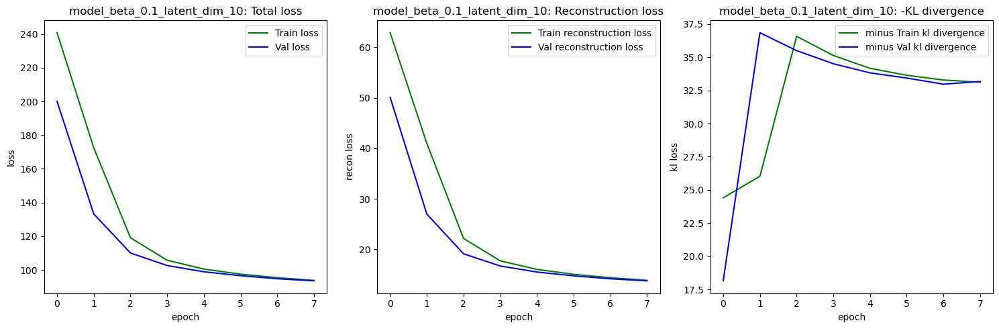

plotting losses for model_beta_0.1_latent_dim_20


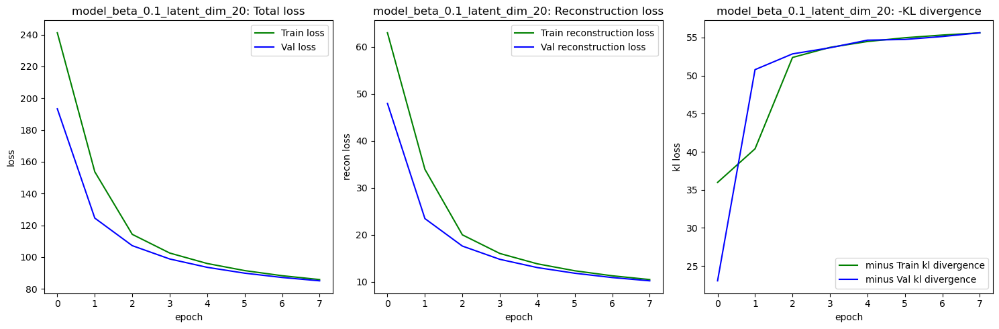

plotting losses for model_beta_0.1_latent_dim_30


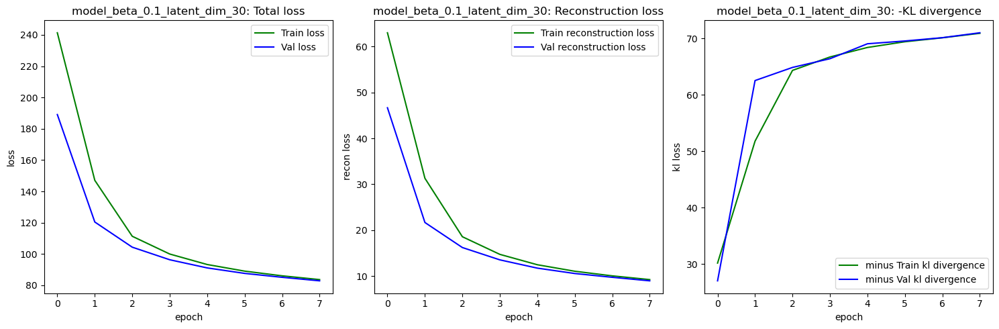

plotting losses for model_beta_0.5_latent_dim_10


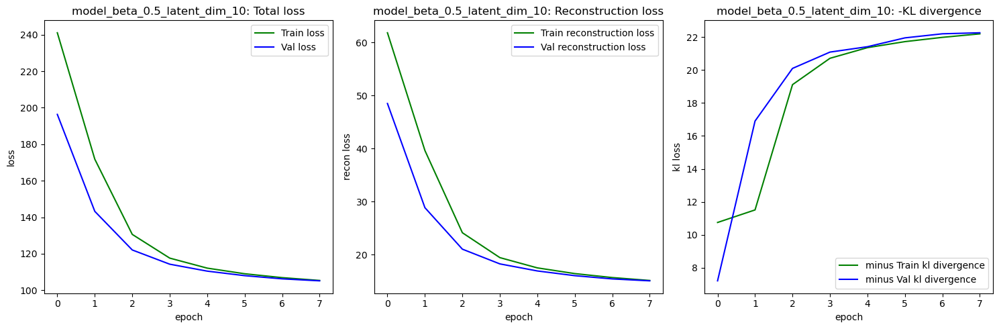

plotting losses for model_beta_0.5_latent_dim_20


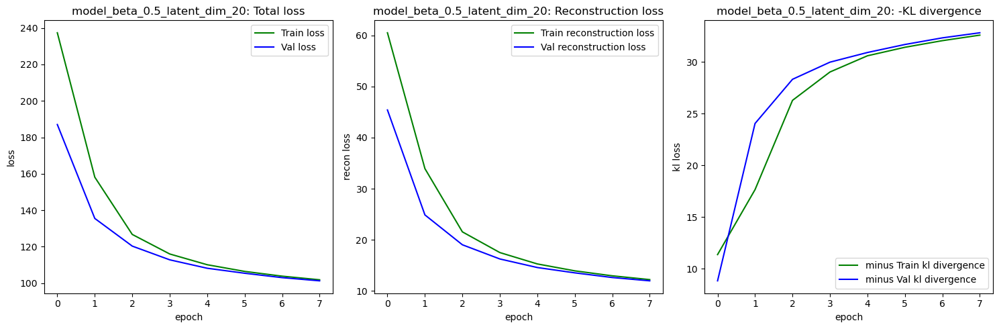

plotting losses for model_beta_0.5_latent_dim_30


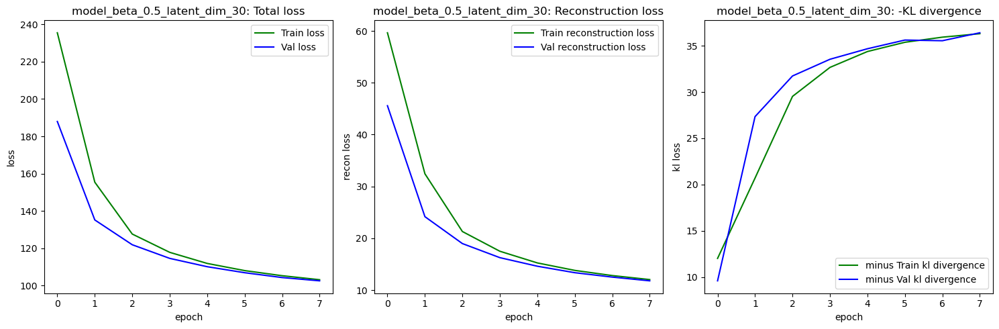

plotting losses for model_beta_1_latent_dim_10


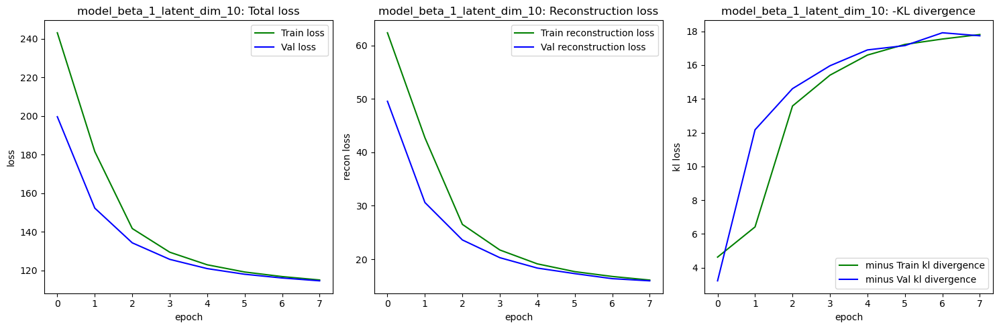

plotting losses for model_beta_1_latent_dim_20


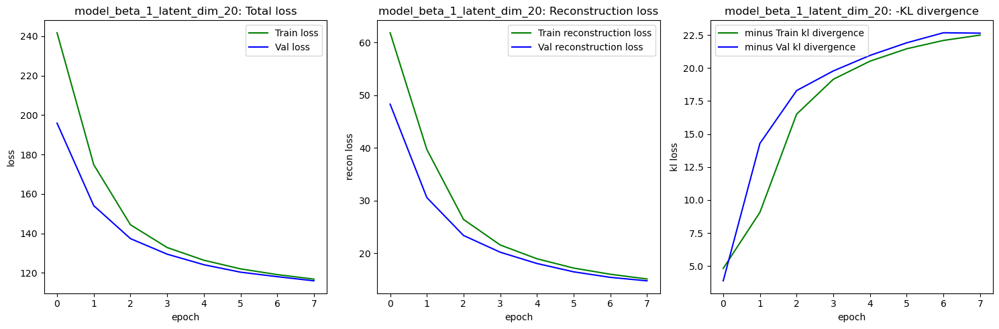

plotting losses for model_beta_1_latent_dim_30


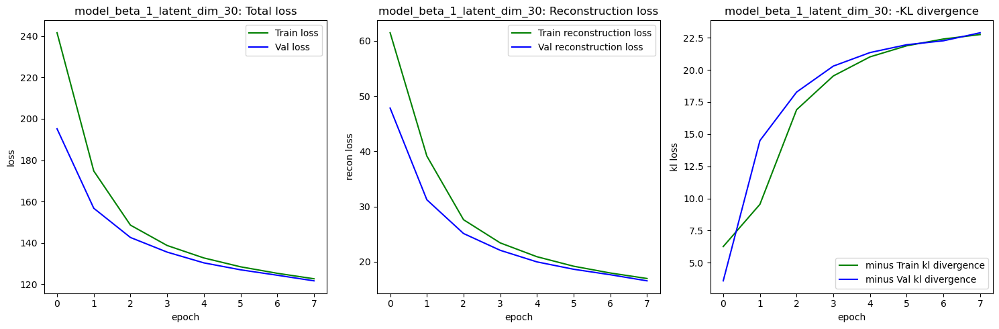

plotting losses for model_beta_5_latent_dim_10


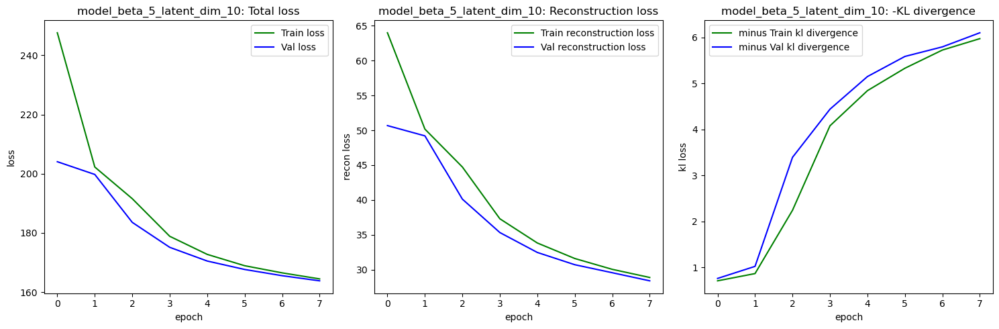

plotting losses for model_beta_5_latent_dim_20


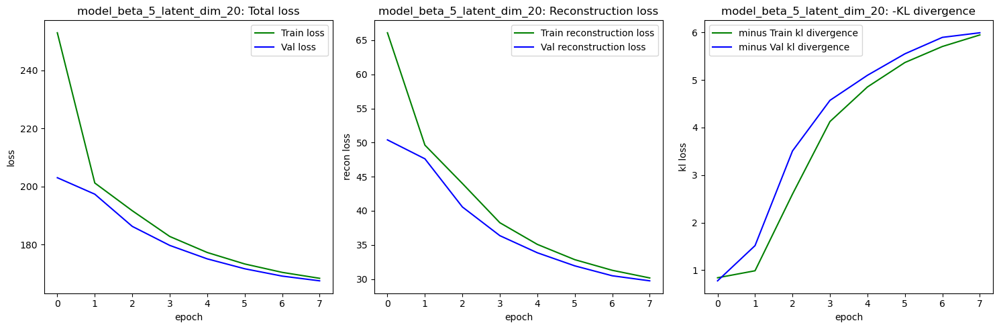

plotting losses for model_beta_5_latent_dim_30


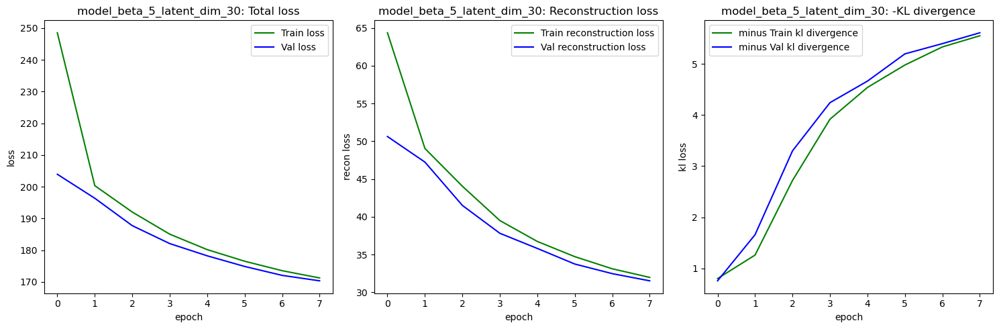

In [331]:

def plot_model_losses(model_name, losses_dict, epochs):
    print(f"plotting losses for {model_name}")
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))
    # Plot total loss
    axes[0].plot(range(epochs), losses_dict["train_total_loss"], color="green", label='Train loss')
    axes[0].plot(range(epochs), losses_dict["val_total_loss"], color="blue", label='Val loss')
    axes[0].set_title(f'{model_name}: Total loss')
    axes[0].set_xlabel('epoch')
    axes[0].set_ylabel('loss')
    axes[0].legend()


    # reconstruction loss
    axes[1].plot(range(epochs), losses_dict["train_recon_loss"], color="green", label='Train reconstruction loss')
    axes[1].plot(range(epochs), losses_dict["val_recon_loss"], color="blue", label='Val reconstruction loss')
    axes[1].set_title(f'{model_name}: Reconstruction loss')
    axes[1].set_xlabel('epoch')
    axes[1].set_ylabel('recon loss')
    axes[1].legend()

    # kl loss
    axes[2].plot(range(epochs), [-1 * kl for kl in losses_dict["train_kl_divergances"]], color="green", label='minus Train kl divergence')
    axes[2].plot(range(epochs), [-1 * kl for kl in losses_dict["val_kl_divergances"]], color="blue", label='minus Val kl divergence')
    axes[2].set_title(f'{model_name}: -KL divergence')
    axes[2].set_xlabel('epoch')
    axes[2].set_ylabel('kl loss')
    axes[2].legend()

    # Display the plots
    plt.tight_layout()
    plt.show()


## plot the training and validation loss of each of the models
for beta in betas:
    for latent_dim in latent_dims:
        model_name = get_model_name(beta, latent_dim)
        plot_model_losses(model_name, full_training_results_dict[model_name], EPOCHS)

**Hyper Parameters Tuning**

d. **Conclusions from visualization of the training process of the different models:**
- The chosen model's beta shouldn't be as low as 0.1, as this makes the kl divergence explode, especially for high latent dimensions
- The chosen model's beta shouldn't be as high as 5, as this has a bad impact on the reconstruction error, which becomes as high as 30.
- For small betas, high latent dimension increases the kl divergence (for the same beta value). 
- The increase of latent value from 20 to 30 does not reduce the reconstruction error. Therefore, it is redundent to use such a high dimention as 30

**Next step:**

train 2 more models with beta = 0.75 for latent dimensions 10 and 20, then decide between those, and those for beta = 1, 0.5 for the same latent dimensions

In [322]:
extra_betas = [0.75]
focused_latent_dims = [10, 20]

additional_full_training_results_dict, additional_final_results_dict = hyperparams_selection(extra_betas, focused_latent_dims)

Training and evalutaing model_beta_0.75_latent_dim_10
Epoch 1
-------------------------------
training loss: 251.660987
test loss: 196.313865 

Epoch 5
-------------------------------
training loss: 118.545442
test loss: 117.036640 

model_beta_0.75_latent_dim_10 final results:
{'train_total_loss': 111.8925180568321, 'val_total_loss': 111.42923003472222, 'train_recon_loss': 16.17551154162837, 'val_recon_loss': 16.013725911458334, 'train_kl_divergances': -19.340584218941483, 'val_kl_divergances': -19.36729679361979}
Training and evalutaing model_beta_0.75_latent_dim_20
Epoch 1
-------------------------------
training loss: 246.193212
test loss: 195.291753 

Epoch 5
-------------------------------
training loss: 120.788198
test loss: 118.516364 

model_beta_0.75_latent_dim_20 final results:
{'train_total_loss': 111.26839142922795, 'val_total_loss': 110.51617621527778, 'train_recon_loss': 14.342555817248774, 'val_recon_loss': 14.116271402994792, 'train_kl_divergances': -25.664234111711092

plotting losses for model_beta_0.5_latent_dim_10


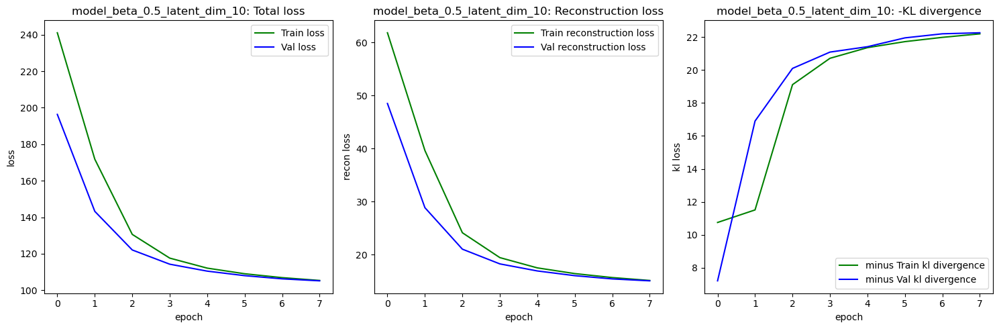

plotting losses for model_beta_0.5_latent_dim_20


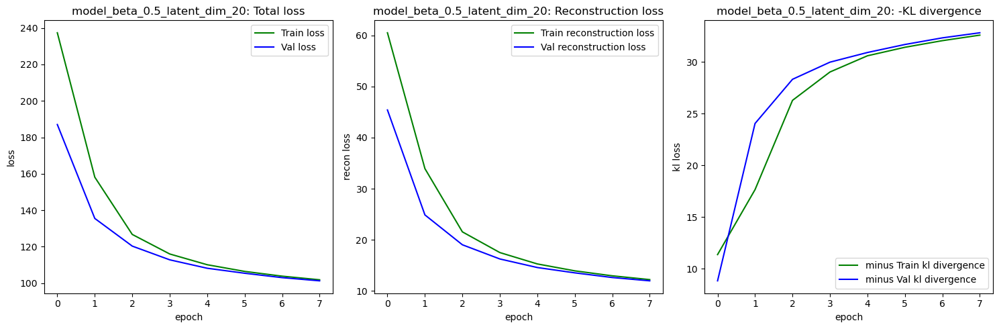

plotting losses for model_beta_0.75_latent_dim_10


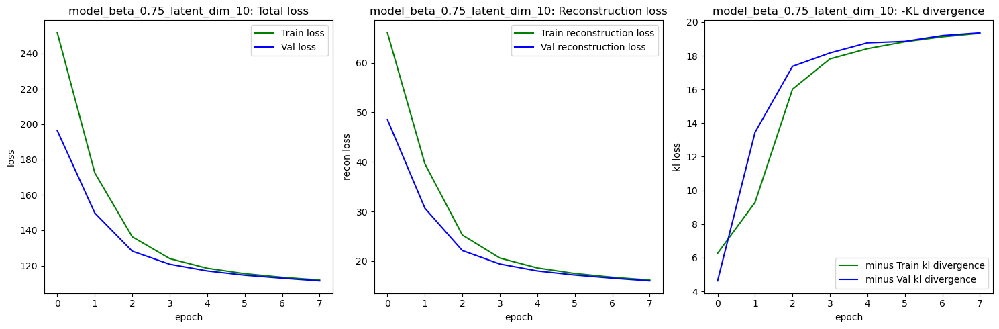

plotting losses for model_beta_0.75_latent_dim_20


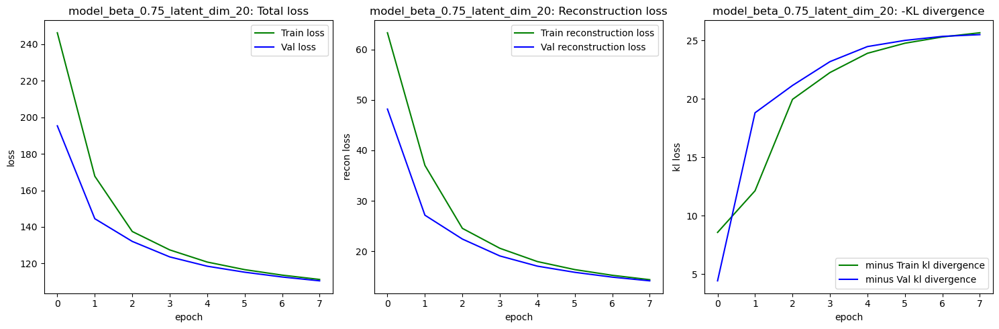

plotting losses for model_beta_1_latent_dim_10


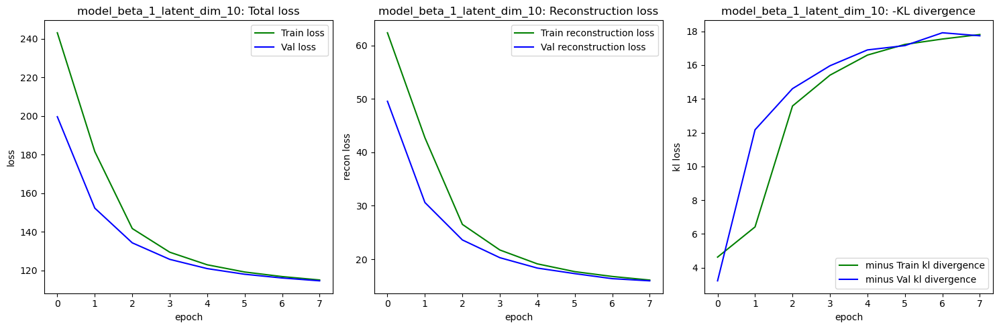

plotting losses for model_beta_1_latent_dim_20


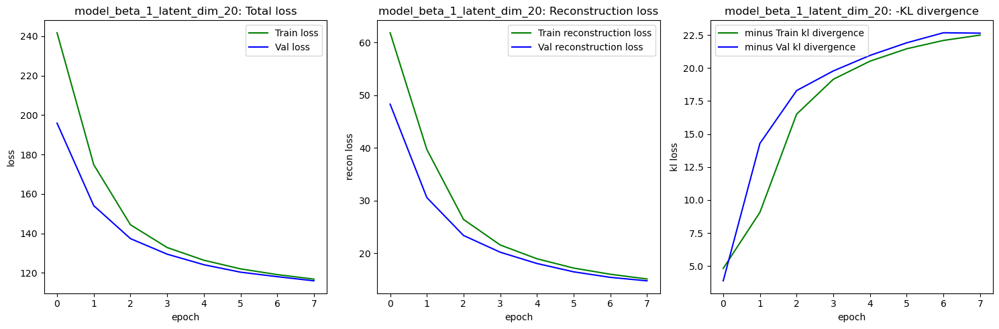

In [332]:
betas_for_decision = [0.5, 0.75, 1]
dims_for_decision = [10, 20]

models_results_for_decision = additional_full_training_results_dict.copy()

for beta in [0.5, 1]:
    for dim in dims_for_decision:
        model_name = get_model_name(beta, dim)
        models_results_for_decision[model_name] = full_training_results_dict[model_name]

hyperparams_combinations = list(itertools.product(betas_for_decision, dims_for_decision))
for beta, dim in hyperparams_combinations:
    model_name = get_model_name(beta, dim)
    plot_model_losses(model_name, models_results_for_decision[model_name], EPOCHS)




**2. Hyper Parameters Tuning**

e. Final comparison

The two models that got the best reconstruction error and kl divergence balance are with latent dimension 10. With Beta = 0.75 and Beta = 1
Let's print out their final results to be able to compare the exact numbers

In [324]:
model_beta_075 = get_model_name(beta=0.75, latent_dim=10)
model_beta_1 = get_model_name(beta=1, latent_dim=10)

print("last epoch results for model with beta = 0.75, latent dimension = 10")
print(additional_final_results_dict[model_beta_075])

print("\nlast epoch results for model with beta = 1, latent dimension = 10")
print(final_results_dict[model_beta_1])


last epoch results for model with beta = 0.75, latent dimension = 10
{'train_total_loss': 111.8925180568321, 'val_total_loss': 111.42923003472222, 'train_recon_loss': 16.17551154162837, 'val_recon_loss': 16.013725911458334, 'train_kl_divergances': -19.340584218941483, 'val_kl_divergances': -19.36729679361979}

last epoch results for model with beta = 1, latent dimension = 10
{'train_total_loss': 115.02845352711397, 'val_total_loss': 114.58579969618056, 'train_recon_loss': 16.108228302600338, 'val_recon_loss': 15.965082668728298, 'train_kl_divergances': -17.807378563974417, 'val_kl_divergances': -17.73446784125434}


**3. Train model with selected hyper params**

The selected values are: Beta = 1, Latent dimension = 10, since their kl divergence was better, as well as a slightly better reconstruction loss.
Now, use the entire train set to train a new VAE model with the selected hyper params.

In [340]:
# Train selected model
torch.manual_seed(rnd_seed)


chosen_beta = 1
chosen_latent_dim = 10

chosen_model = VAE(chosen_latent_dim).to(device)

chosen_model.train()
optimizer = torch.optim.Adam(chosen_model.parameters(), lr=0.0001)

epochs = 10

train_losses = []
train_recon_losses = []
train_kl_divergances = []

test_losses = []
test_recon_losses = []
test_kl_divergances = []

for t in range(epochs):
    print(f"Epoch {t+1}\n-------------------------------")
    mean_loss_train, mean_recon_loss_train, mean_kl_divergance_train = train_one_epoch(train_dataloader, chosen_model, loss_function_VAE, reconstruction_loss, kl_divergence_loss, optimizer, chosen_beta)
    train_losses.append(mean_loss_train)
    train_recon_losses.append(mean_recon_loss_train)
    train_kl_divergances.append(mean_kl_divergance_train)

    mean_loss_test, mean_recon_loss_test, mean_kl_divergance_test = test(test_dataloader, chosen_model, loss_function_VAE, reconstruction_loss, kl_divergence_loss, chosen_beta)
    test_losses.append(mean_loss_test)
    test_recon_losses.append(mean_recon_loss_test)
    test_kl_divergances.append(mean_kl_divergance_test)
print("Done!")

#######################################################################
#                       ** END OF YOUR CODE **
#######################################################################

Epoch 1
-------------------------------
training loss: 241.821480
test loss: 193.699822 

Epoch 2
-------------------------------
training loss: 164.074250
test loss: 143.195528 

Epoch 3
-------------------------------
training loss: 135.921762
test loss: 127.726943 

Epoch 4
-------------------------------
training loss: 125.123477
test loss: 121.094731 

Epoch 5
-------------------------------
training loss: 120.309106
test loss: 117.738970 

Epoch 6
-------------------------------
training loss: 117.628475
test loss: 115.767558 

Epoch 7
-------------------------------
training loss: 115.783608
test loss: 114.075113 

Epoch 8
-------------------------------
training loss: 114.426248
test loss: 112.827247 

Epoch 9
-------------------------------
training loss: 113.323978
test loss: 112.052300 

Epoch 10
-------------------------------
training loss: 112.446181
test loss: 111.382986 

Done!


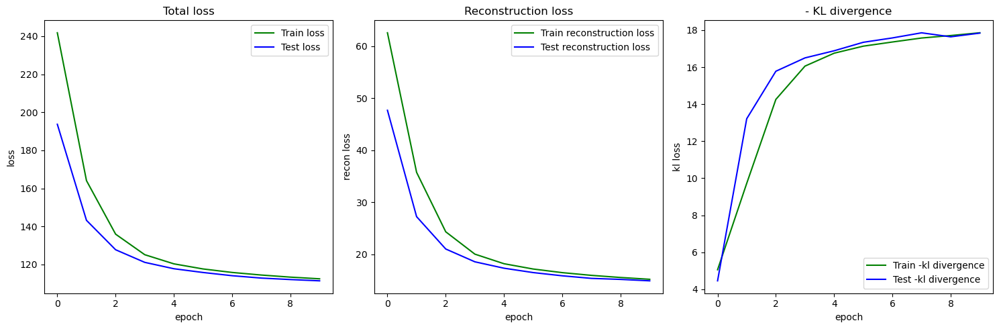

In [333]:
# Plotting code

#######################################################################
#                       ** START OF YOUR CODE **
#######################################################################

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))

# Plot total loss
axes[0].plot(range(epochs), train_losses, color="green", label='Train loss')
axes[0].plot(range(epochs), test_losses, color="blue", label='Test loss')
axes[0].set_title('Total loss')
axes[0].set_xlabel('epoch')
axes[0].set_ylabel('loss')
axes[0].legend()


# reconstruction loss
axes[1].plot(range(epochs), train_recon_losses, color="green", label='Train reconstruction loss')
axes[1].plot(range(epochs), test_recon_losses, color="blue", label='Test reconstruction loss')
axes[1].set_title('Reconstruction loss')
axes[1].set_xlabel('epoch')
axes[1].set_ylabel('recon loss')
axes[1].legend()

# kl loss
axes[2].plot(range(epochs), [-1 * kl for kl in train_kl_divergances], color="green", label='Train -kl divergence')
axes[2].plot(range(epochs), [-1 * kl for kl in test_kl_divergances], color="blue", label='Test -kl divergence')
axes[2].set_title('- KL divergence')
axes[2].set_xlabel('epoch')
axes[2].set_ylabel('kl loss')
axes[2].legend()

# Display the plots
plt.tight_layout()
plt.show()



#######################################################################
#                       ** END OF YOUR CODE **
#######################################################################

## Plot loss (3 points)

Analyze and discuss:

1.   Loss curves (reconstruction and KL divergence)
2.   Explain how different values of $\beta$ affect your training.

<font color='red'>***YOUR ANSWER***</font>

1. First, since the kl divergence is multiplied by MINUS $\beta$, I decided it to multiply it by minus 1 before plotting, to better demonstrate the contribution it makes to the entire loss function. 

    a. -KL divergence graph: The -kl divergence graph begins small, and increases with the epochs. This means at the beginning of the process, before the model learns anything, it is small, and doesn't add to the loss of the model very much. At the beginning of the training process, the majority of the loss is from the construction loss, since the model still doesn't know how to encode and decode the images. The more the model learns, the larger the regularization term becomes, but the increase becomes smaller in every epoch. This is inline with the kl divergence role and definition: The kl divergence measures how much the latent varibale distribution differs from the standard normal distribution (Normal distribution with mu=0, sigma=1). Therefore, at the beginning when the model doesn't know how to encode the data, there is no reason for the latent variable distribution to differ from the standard normal distribution: It doesn't contain any information anyways. The more the reconstruction error decreases and the model learns, the more information should be encoded into the latent variable. Therefore, it becomes less and less close to the standard normal distribution, and the kl divergence becomes larger. It increases much less in the final epochs, where beta * kl_divergence becomes equal to the reconstruction loss, and it acts as a meaningful regularization component to the model's loss.

    b. The reconstruction loss begins very high, as the model doesn't know how to reconstruct an image at the beginning of the process. The more the model learns, the reconstruction loss decreases as the model reconstruct images that are more and more similar to the original input.

    
2. The $\beta$ param dictates how much weight would the training put on the kl divergence. Therefore, Small $\beta$ values will result in the kl_divergence component being a small part of the general VAE loss, and the reconstruction loss being the main component of the VAE loss. This causes the training process to focus on reducing the reconstruction loss, and putting less emphasis on the disentanglement that's enfoced by the kl divergence component of the loss. In terms of the plots, the smaller the beta value is, the smaller the reconstruction loss will get, as the optimization will focus on improving it over improving the kl divergence. On the other hand, if the $\beta$ value is larger, the kl divergence component becomes a more meaningful component of the entire loss. Therefore, the learning process will be more focus on improving the kl divergence loss, in the expense of getting higher reconstruction loss. Bellow is a plot to demonstrate this affect.




plotting losses for model_beta_0.1_latent_dim_20


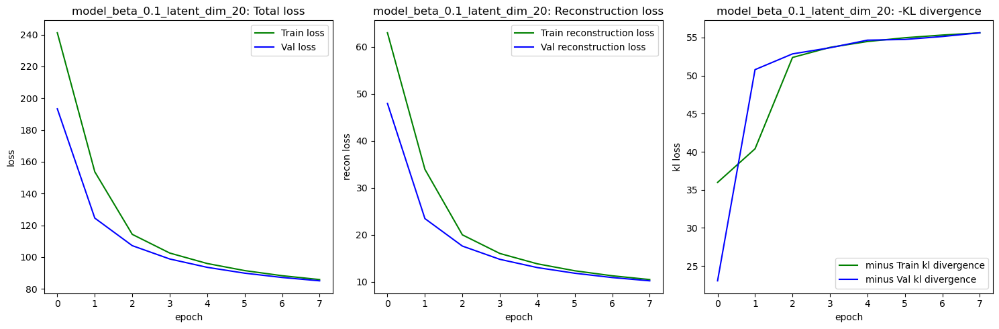

plotting losses for model_beta_0.5_latent_dim_20


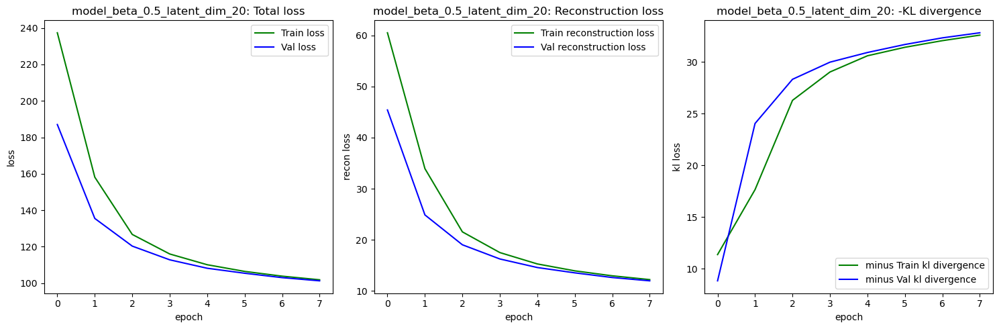

plotting losses for model_beta_1_latent_dim_20


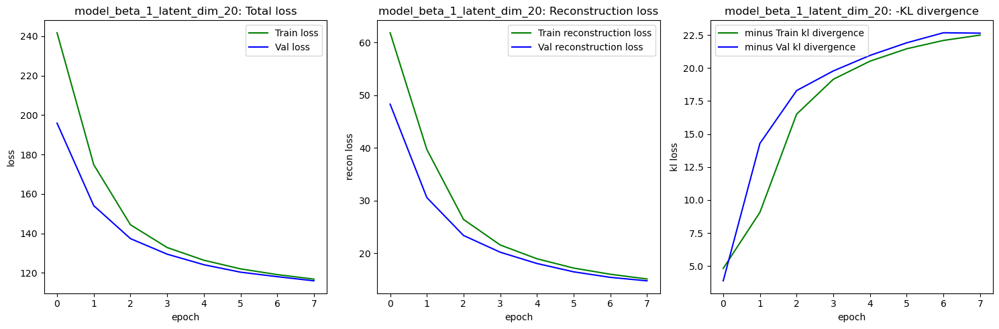

plotting losses for model_beta_5_latent_dim_20


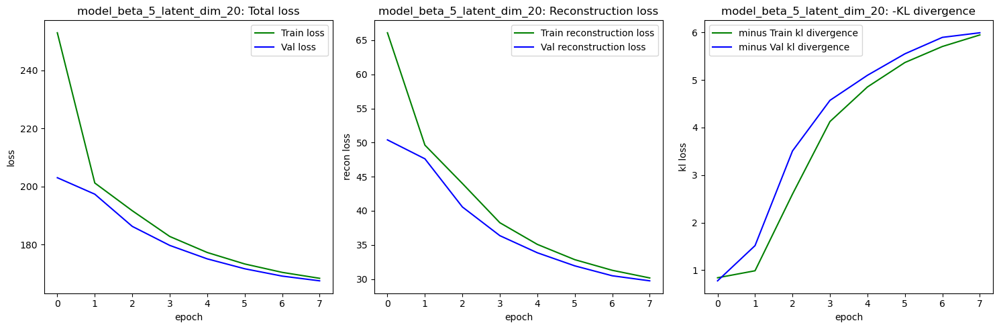

In [334]:
## Visualization: how the value of beta affect the training process:
for beta in betas:
    model_name = get_model_name(beta, latent_dim=20)
    plot_model_losses(model_name, full_training_results_dict[model_name],EPOCHS)

## Sample and reconstruction quality (6 points)
Simply run the below cell to show the output

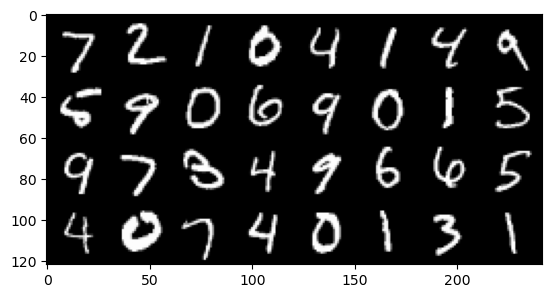

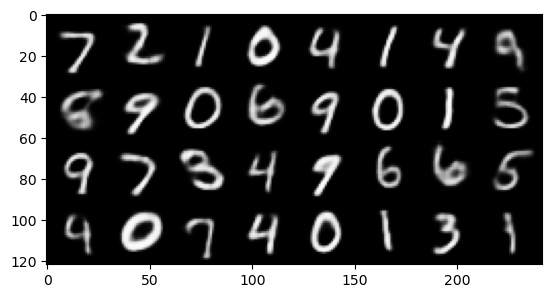

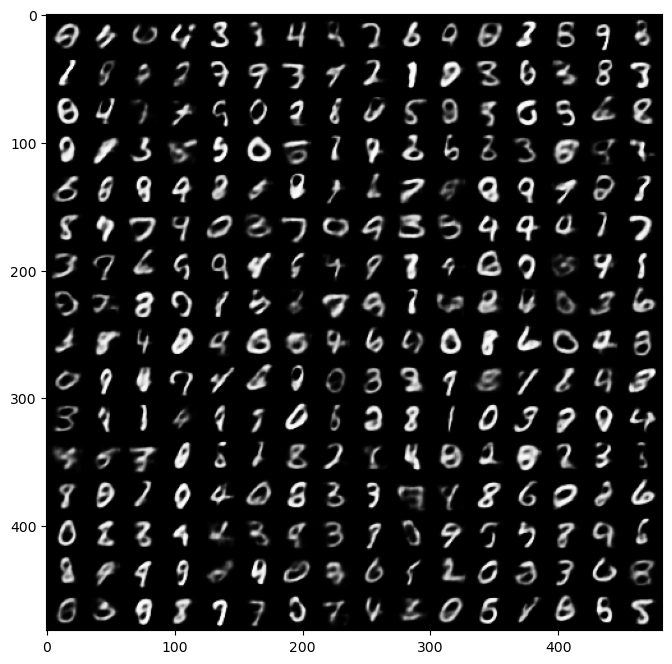

In [367]:
# Input images
def plot_reconstruction_and_sample(model, latent_dim):
    model.eval()
    sample_inputs, _ = next(iter(test_dataloader))
    fixed_input = sample_inputs[0:32, :, :, :]

    # visualize the original images of the last batch of the test set
    img = make_grid(denormalize(fixed_input), nrow=8, padding=2, normalize=False,
                    scale_each=False, pad_value=0)
    plt.figure()
    show(img)

    # Reconstructed images
    with torch.no_grad():

        _, _, recon_batch = model(sample_inputs.to(device))
        recon_batch = recon_batch.unsqueeze(1).reshape(-1,1,28,28)
        recon_batch = recon_batch[0:32, :, :, :]
        recon_batch = recon_batch.cpu()
        recon_batch = make_grid(denormalize(recon_batch), nrow=8, padding=2, normalize=False,
                                scale_each=False, pad_value=0)
        plt.figure()
        show(recon_batch)

    # Generated Images
    n_samples = 256
    z = torch.randn(n_samples,latent_dim).to(device)
    with torch.no_grad():

        samples = model.decode(z)
        samples = samples.unsqueeze(1).reshape(-1,1,28,28)
        samples = samples.cpu()
        samples = make_grid(denormalize(samples), nrow=16, padding=2, normalize=False,
                                scale_each=False, pad_value=0)
        plt.figure(figsize = (8,8))
        show(samples)

plot_reconstruction_and_sample(chosen_model, chosen_latent_dim)

## Reconstruction and generated samples discussion (5 points)
Analyze and briefly discuss:

1.   Reconstruction quality
2.   Generated samples quality

Explain in your answers how they relate to different values of $\beta$, latent dimension and VAE architecture

<font color='red'>***YOUR ANSWER***</font>

1.   Overall, the reconstruction quality is not bad, especially if taking into account the fact that the information was compressed into a 10 dimension vector and then decompressed from it. Almost all digits are recognizable though blurry, and the ones that aren't recognizable are decompressed and reconstructed from images that are not very clear to begin with (The tilted 9 on the first row on the right, the odd 5 on the second row to the left, and the nineish 4 on the bottom row to the left).


  - Relation to different values of $\beta$: The lower the value of $\beta$ is, the better the reconstruction will be. This is due to the fact that lower beta means lower importance to the kl divergence component in the loss function, and higher significance to the reconstruction loss in the loss function and thus in the training process. This fact is also demonstrated in the plots bellow, of models with various values of $\beta$: 

    - The model with Beta = 0.1 reconstructs the digits successfully, with all of them being recognizable and a bit less blurry.
    - The model with Beta = 5 reconstructs blurry images, and even swaps some digits. For exmaple, in the bottom row in the centre it switched 0 into 8 and 4 into 9

  - Relation to latent dimension: The latent dimension acts as "the bottleneck" of the model: all the information for the reconstruction should be encoded into this dimension. Therefore, if the dimension is too low, the model might be lacking crusial information required for the reconstruction, and therefore the quality of the reconstructions might be limited. However, if the latent dimension is too high, it might contain unimportant information that will result in unseccessfull reconstruction. For example, I plotted bellow models with the same $\beta$ as my chosen model (1) but with latent dimensions of 20 and 30. The one with dimension 20 is reconstructing recognizable digits for every digit in the sample. The 30 dimension model, however, changes 5 and 4 into a 9, in the leftmost column

  - The architecture of the VAE impacts the reconstruction quality as it determines what relations and patterns the model will be able to extract from the image encode, and how it will be able to extract and decode the latent vector.

2. The quality of the generated samples of my chosen model is more varied: In some cases my model was able to accurately generate a hand writing form of an existing digit. In other cases, it created a grey weak digit, and in some cases it creates a sign that could have been a digit but is not.

  - Relation to different values of $\beta$: Generally speaking, higher Beta is correlated with better generated images. This is because higher $\beta$ values means higher enforcement of the latent space disentangelment by a larger regularization term out of the entire loss function. Disentanglement of the latent space means that every dimension of the latent space is used for representing one specific semantically meaningful feature. For example, in faces images, one dimension of the latent space can encode the angle that the face is looking. Disentangled latent space allows better image generation, due to the fact that the value of every feature can be sample individualy without harming the reliability of the entire image and without impacting the other features. Therefore, when sampling a vector in the latent dimension, we sample the different independent features of the digit, without harming the other features of it. (In the face example, we can sample the face's angle, the hair color, and the shape of the nose, and get a perfectly reliable face)
  
  - Relation to latent dimension: When sampling and generating images for a model with high latent space (30), the generated images are less successful and reliable than the ones for a 10 dimension latent space. In my opinion this could be a result of 
    - The larger the dimension is, the harder it is to enforce latent space disentanglement, and therefore the harder it is to successfully sample different features of the digits.
    - Digits are well defined signs, and there are only 10 of them. It is possible that the high dimensionality of the latent space allows sampling of features that are not essential for creating the digits, which adds noise and unrelevant features to the created images.

    On the other hand, it is possible that if the latent dimension is too low, it will not be expressive enough to allow passing enough features for creating a reliable digit. However, I didn't run such a model to validate this idea.



**Sample and reconstruction of models with different params**

Bellow images are reconstructed and generated by models with different betas and latent dimensions. I used this code and images to investigate and have a more informed discussion in this section.

**Beta = 0.1**

Beta = 0.1


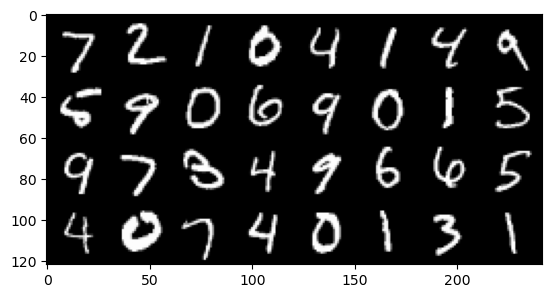

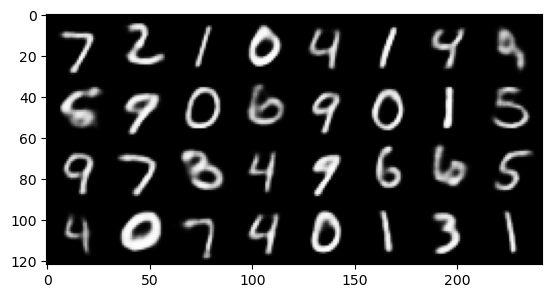

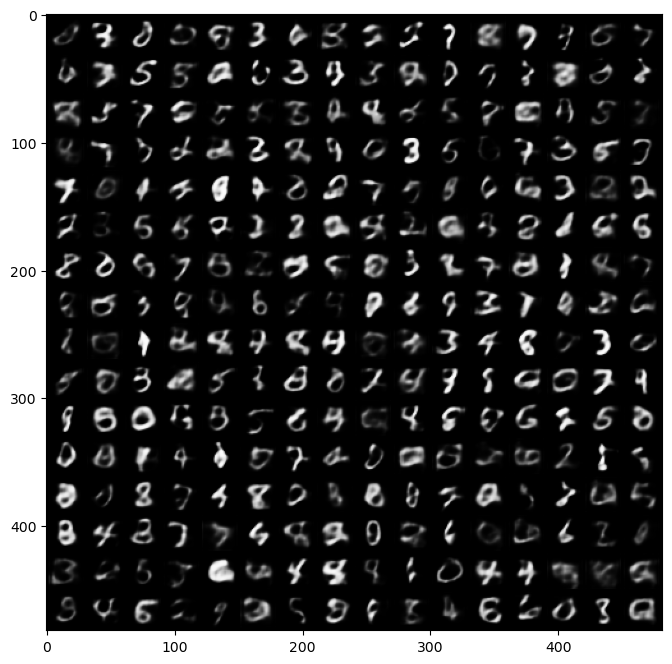

In [370]:
low_beta_model = pickle.load(open(os.path.join(MODELS_DIR, "model_beta_0.1_latent_dim_10.pkl"), "rb"))
plot_reconstruction_and_sample(low_beta_model, latent_dim=10)
print("Beta = 0.1")

**Beta = 5**

torch.Size([256, 10])


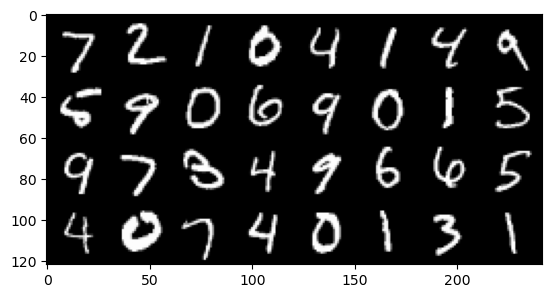

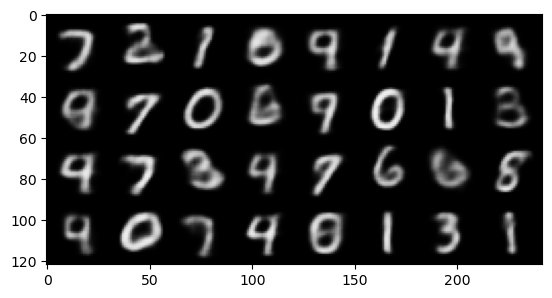

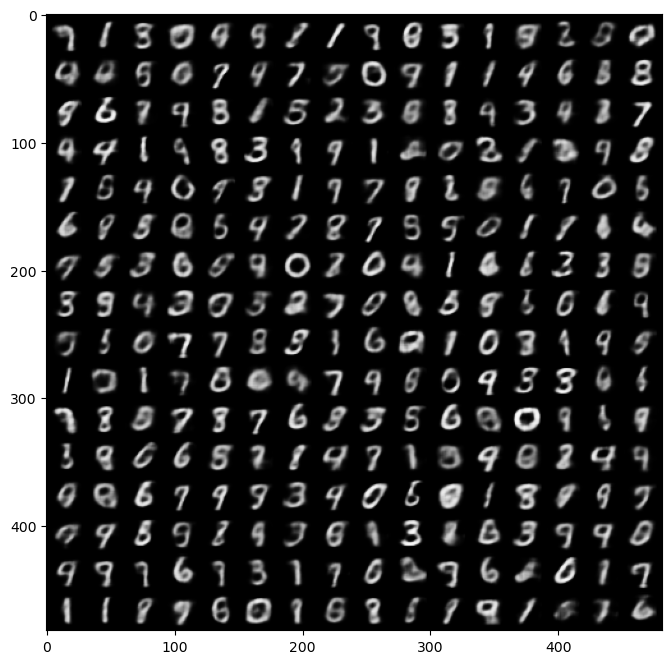

In [361]:
high_beta_model = pickle.load(open(os.path.join(MODELS_DIR, "model_beta_5_latent_dim_10.pkl"), "rb"))
plot_reconstruction_and_sample(high_beta_model, latent_dim=10)

**Latent dimension = 20**

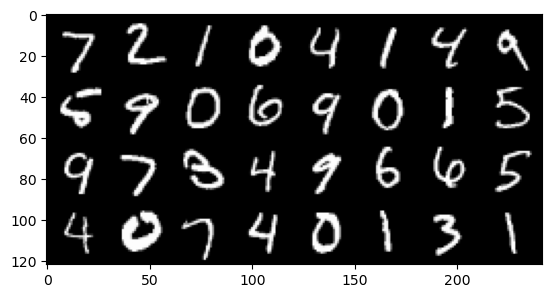

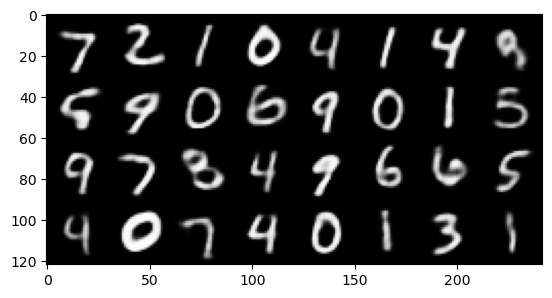

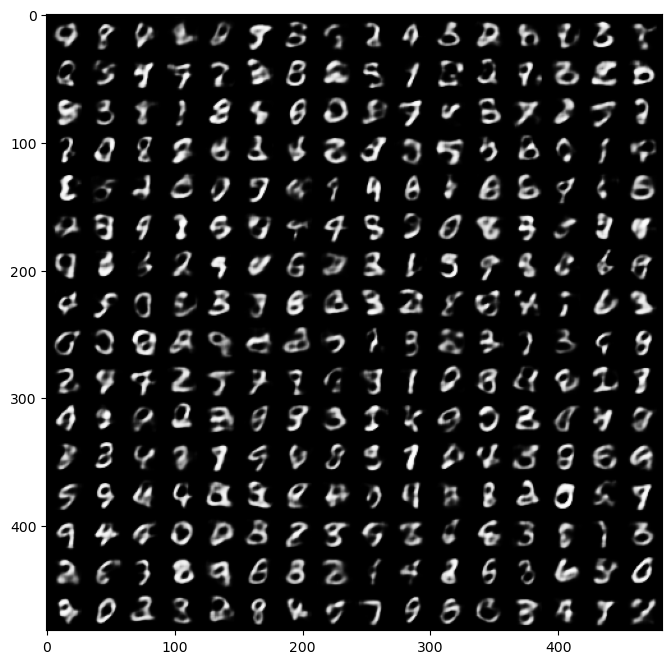

In [376]:
middle_dim_model = pickle.load(open(os.path.join(MODELS_DIR, "model_beta_1_latent_dim_20.pkl"), "rb"))
plot_reconstruction_and_sample(middle_dim_model, latent_dim=20)

**Latent Dimension = 30**

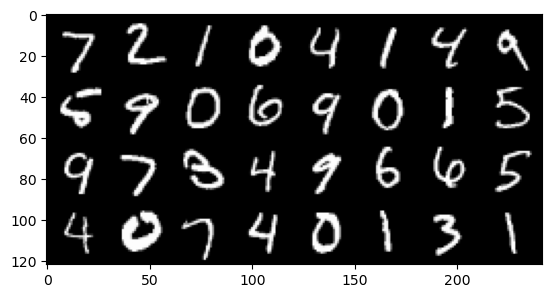

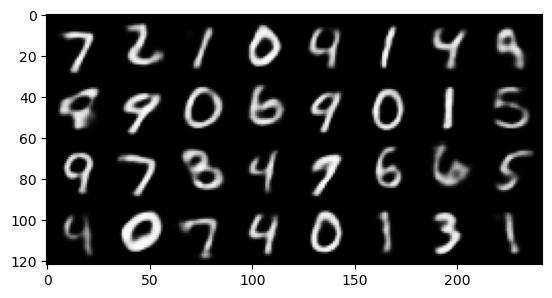

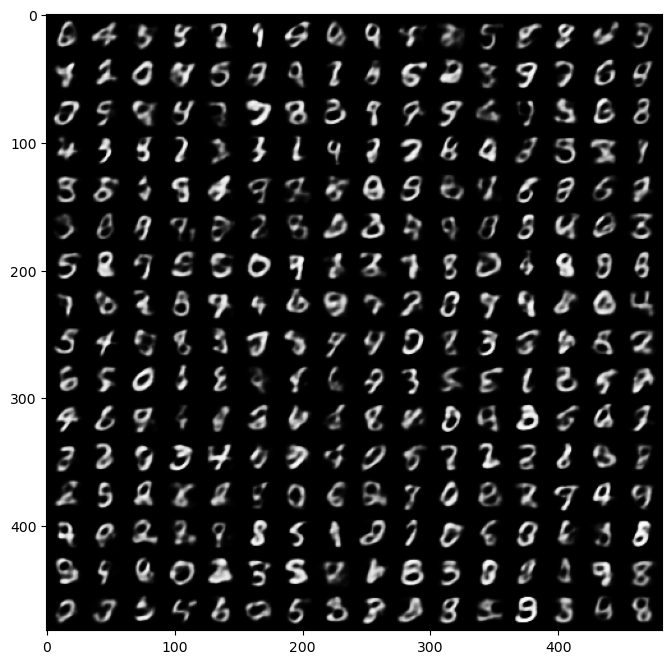

In [375]:
high_dim_model = pickle.load(open(os.path.join(MODELS_DIR, "model_beta_1_latent_dim_30.pkl"), "rb"))
plot_reconstruction_and_sample(high_dim_model, latent_dim=30)

## T-SNE on Embeddings (5 points)
Extract the latent representations of the test set and visualize them using [T-SNE](https://en.wikipedia.org/wiki/T-distributed_stochastic_neighbor_embedding)

Run the below cells (no coding required).

Qualitatively assess the learned representations of your model using the T-SNE plots.


In [355]:
alt.data_transformers.disable_max_rows()

def plot_tsne(tsne_xy, dataloader, num_points=1000):

    images, labels = zip(*[(x[0].numpy()[0,:,:,None], x[1]) for x in dataloader.dataset])

    num_points = min(num_points, len(labels))
    data = pd.DataFrame({'x':tsne_xy[:, 0], 'y':tsne_xy[:, 1], 'label':labels,
                        'image': images})
    data = data.sample(n=num_points, replace=False)

    alt.renderers.set_embed_options('light')
    selection = alt.selection_single(on='mouseover', clear='false', nearest=True)
    scatter = alt.Chart(data).mark_circle().encode(
        alt.X('x:N',axis=None),
        alt.Y('y:N',axis=None),
        color=alt.condition(selection,
                            alt.value('lightgray'),
                            alt.Color('label:N')),
        size=alt.value(100),
        tooltip='label:N'
    ).add_selection(
        selection
    ).properties(
        width=400,
        height=400
    )

    digit  = alt.Chart(data).transform_filter(
        selection
    ).transform_window(
        index='count()'           # number each of the images
    ).transform_flatten(
        ['image']                 # extract rows from each image
    ).transform_window(
        row='count()',            # number the rows...
        groupby=['index']         # ...within each image
    ).transform_flatten(
        ['image']                 # extract the values from each row
    ).transform_window(
        column='count()',         # number the columns...
        groupby=['index', 'row']  # ...within each row & image
    ).mark_rect(stroke='black',strokeWidth=0).encode(
        alt.X('column:O', axis=None),
        alt.Y('row:O', axis=None),
        alt.Color('image:Q',sort='descending',
            scale=alt.Scale(scheme=alt.SchemeParams('lightgreyteal',
                            extent=[1, 0]),

            ),
            legend=None
        ),
    ).properties(
        width=400,
        height=400,
    )

    return scatter | digit

In [356]:
# TSNE
from sklearn.manifold import TSNE

for t, (x, y) in enumerate(test_dataloader):
    if t == 0:
        data = x
        labels = y
    else:
        data = torch.cat((data, x))
        labels = torch.cat((labels, y))

# Then let's apply dimensionality reduction with the trained encoder

with torch.no_grad():
    data = data.to(device)
    mu, logvar = chosen_model.encode(data)
    z = (chosen_model.reparametrize(mu, logvar)).cpu().detach().numpy()

z_embedded = TSNE(n_components=2).fit_transform(z)

In [357]:
plot_tsne(z_embedded, test_dataloader, num_points=1000)

/Users/user/anaconda3/lib/python3.11/site-packages/altair/utils/deprecation.py:65: AltairDeprecationWarning: 'selection_single' is deprecated.  Use 'selection_point'
  warnings.warn(message, AltairDeprecationWarning, stacklevel=1)
/Users/user/anaconda3/lib/python3.11/site-packages/altair/utils/deprecation.py:65: AltairDeprecationWarning: 'add_selection' is deprecated. Use 'add_params' instead.
  warnings.warn(message, AltairDeprecationWarning, stacklevel=1)


alt.HConcatChart(...)

### Discussion
Analyze and discuss the visualized T-SNE representations

1. What role do the KL loss term and $\beta$ have?
2. Can you find any outliers?

<font color='red'>***YOUR ANSWER***</font>

The vizualization of the representation of test set samples encoded in the latent space, shows some interesting results:
Firstly, we can see that generally speaking, samples with the same labels are clustered together, and located close to one another in the space (this can be easily identified since the point that represent each sample is coloured according to its label).

Secondly, we can see that cluster of closer digits are located close to one another in the space, while clusters that represent digits that are very different from one another are located far in the space. For example: the cluster of the digit 1 (orange) is located at the top left corner, with some distance between its edges and the closest clusters, as no digit is particularly similar to the digit 1. The closest clusters to it are 7 and 2, both share with the digit 1 the long tilted line in the middle of the image.
On the other hand, clusters of digits that are relatively similar to one another are located very close in the space, and might even mix in the edges. For example, the cluster of 4 (green) and 9 (grey) are very close to one another and even mixed in the edges. This is inline with the fact that 4 and 9 tend to be very similar in some hand writings, and share one vertical line and half a circle in the top. 


1. The KL loss term's role in regards to the representation of samples in latent space, is to encourage the model to create a representation that is as close as possible to the standard normal distribution. In the 2 dimensional space we use for plotting here, this means the dots will be normally distributed arround the centre of a circle. The role of $\beta$ in this is to control how much weigh is the kl loss taking out of the entire loss function of the model, and how much emphasis will be put on the regularization in the training process.  To demonstrate that, I plotted bellow the representation of latent space for a model with latent dimension = 10 and $\beta$ = 5. Which means, in the training process of the model there was a big significance to the regularization term. The result shows a distribution that is almost a perfect circle in the middle of the space, that is not well seperated into the different clusters.
In my model's case, $\beta$ = 1, so there is a balance between a circle like shape of the latent space representation, to still a clear separation into separated clusters between the different labels. 


2. There are a few outliers in the representation of the test samples in the latent space. I detailed about a few of them and tried to reason about why they were located far from their cluster in the latent space: 
  - In the cluster of 1 at the top left corner, there is one 9 digit. Its location in the space could be explained by its tiny circle at the top, which is different from many 9 digits that have a more significant circle. This makes this 9 look similar to 1, as its main feature is the line along the image, and confuses the model.
  - In the side of the 2 cluster, there is one 4 digit, which has a large circle on the left bottom, similarly to the digit 2.
  - In the middle of the 9 cluster, there are 2 samples of the digit 4. Both of them has a very thin open in the top, which makes their top form almost a close shape, just like the circle on the top of the digit 9.

**T-SNE embeddings of representation by model with $\beta$=5**

To support arguments in the discussion above

In [378]:
# TSNE
from sklearn.manifold import TSNE

for t, (x, y) in enumerate(test_dataloader):
    if t == 0:
        data = x
        labels = y
    else:
        data = torch.cat((data, x))
        labels = torch.cat((labels, y))

# Then let's apply dimensionality reduction with the trained encoder

with torch.no_grad():
    data = data.to(device)
    mu, logvar = high_beta_model.encode(data)
    z = (high_beta_model.reparametrize(mu, logvar)).cpu().detach().numpy()

z_embedded = TSNE(n_components=2).fit_transform(z)

plot_tsne(z_embedded, test_dataloader, num_points=1000)

/Users/user/anaconda3/lib/python3.11/site-packages/altair/utils/deprecation.py:65: AltairDeprecationWarning: 'selection_single' is deprecated.  Use 'selection_point'
  warnings.warn(message, AltairDeprecationWarning, stacklevel=1)
/Users/user/anaconda3/lib/python3.11/site-packages/altair/utils/deprecation.py:65: AltairDeprecationWarning: 'add_selection' is deprecated. Use 'add_params' instead.
  warnings.warn(message, AltairDeprecationWarning, stacklevel=1)


alt.HConcatChart(...)